# PCA Index Dashboard Examples

In [1]:
import pandas as pd
import plotly.express as px

import config
import load_fred
import pca_index

DATA_DIR = config.DATA_DIR

import warnings
warnings.filterwarnings("ignore")

In [2]:
now = pd.Timestamp.utcnow()
# convert now to central time 
print(f"This script was last run at {now} (UTC)")
print(f"In US/Central Time, this is {now.tz_convert('US/Central')}")

This script was last run at 2024-08-11 10:21:19.612855+00:00 (UTC)
In US/Central Time, this is 2024-08-11 05:21:19.612855-05:00


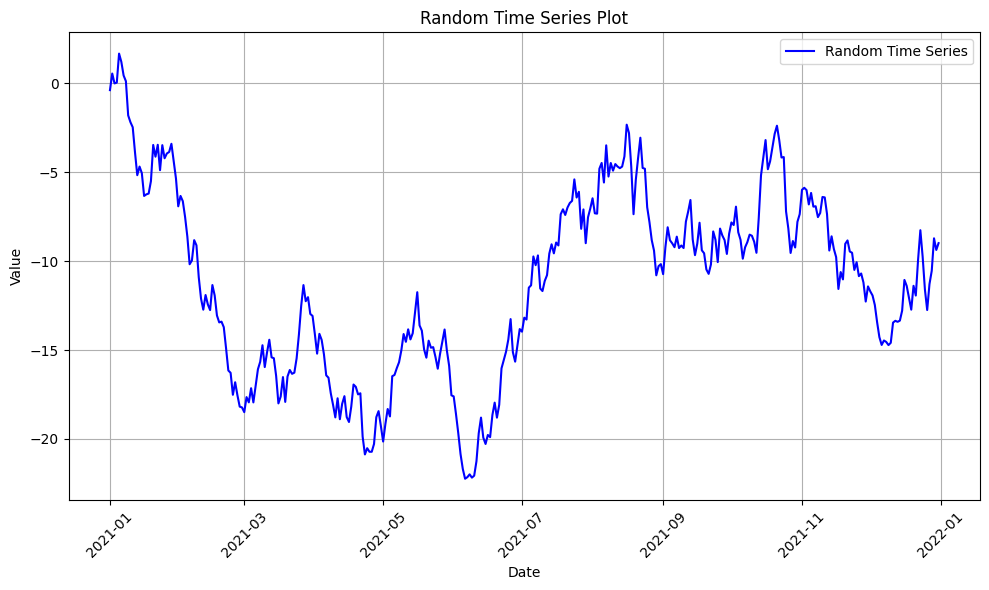

We are just generating a random time serie here.


In [3]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Generating a random time series data
dates = pd.date_range(start="2021-01-01", end="2021-12-31", freq='D')
data = np.random.randn(len(dates)).cumsum()

# Creating the plot
plt.figure(figsize=(10, 6))
plt.plot(dates, data, label='Random Time Series', color='blue')
plt.title('Random Time Series Plot')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

# Display the plot
plt.show()
print('We are just generating a random time serie here.')

In [4]:
df = load_fred.load_fred(data_dir=DATA_DIR)
dfn = pca_index.transform_series(df)

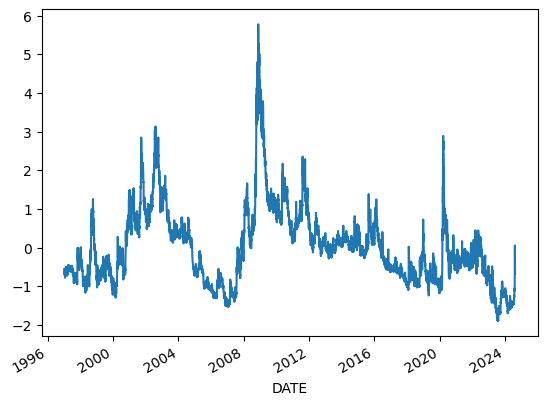

In [5]:
## Visualize Principal Component 1
pc1, loadings = pca_index.pca(dfn, module="scikitlearn")
pc1.plot();

In [6]:
# Simple version
fig = px.line(pc1)
fig.show()

In [7]:
# Using slider and quick views
pca_index.pc1_line_plot(pc1)

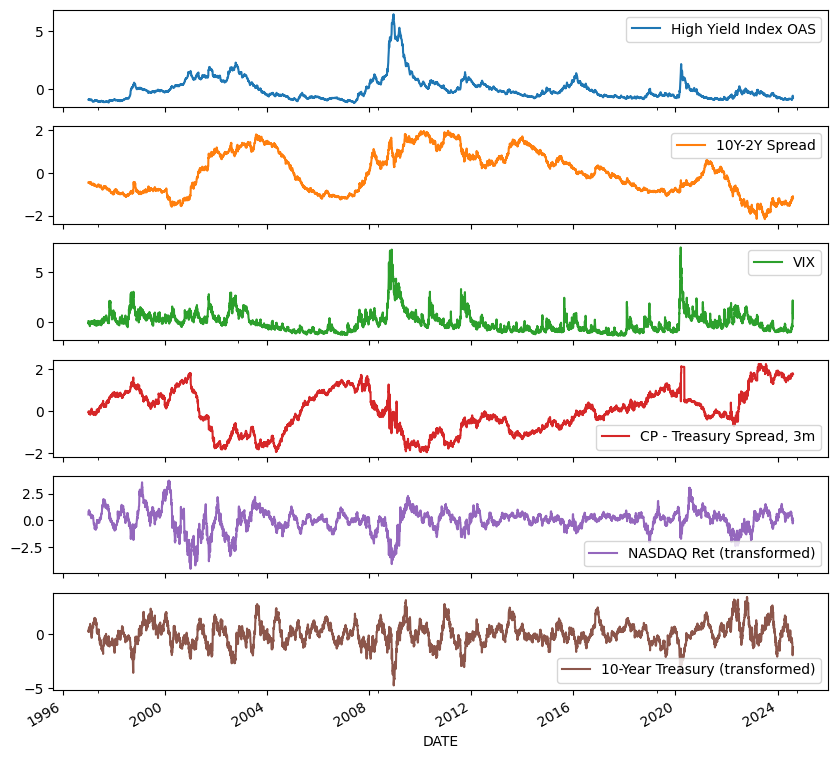

In [8]:
## Visualize normalized and raw series
dfn.plot(subplots=True, figsize=(10, 10));


In [9]:
fig = px.line(dfn, facet_col="variable", facet_col_wrap=1)
fig.update_yaxes(matches=None)
fig.show()


In [10]:
pca_index.plot_unnormalized_series(df)

In [11]:
pca_index.plot_normalized_series(dfn)